# Stock Price Prediction (Research)

## Imports

In [1]:
import yfinance as yf
import pandas as pd
import datetime
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split



## Loading in the stock data

In [2]:
# Scrape S&P 500 tickers from Wikipedia
url = 'https://en.wikipedia.org/wiki/List_of_S%26P_500_companies'
data = pd.read_html(url)
sp500_tickers = data[0]['Symbol'].tolist()


In [3]:
# Get the current date
end_date = datetime.datetime.now().strftime("%Y-%m-%d")

# start date
start_date = '2010-01-01'

sp500_data = {}

# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # Download historical data for the ticker from Yahoo Finance
    data = yf.download(ticker, start=start_date, end=end_date)
    
    # Store the data in a Pandas DataFrame with the ticker as the column name
    sp500_data[ticker] = pd.DataFrame(data)




[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

In [6]:
# Print the first few rows of each DataFrame
for ticker, data_frame in sp500_data.items():
    print(f"First few rows of {ticker}:")
    print(data_frame.head())


First few rows of MMM:
                 Open       High        Low      Close  Adj Close   Volume
Date                                                                      
2010-01-04  83.089996  83.449997  82.669998  83.019997  53.295422  3043700
2010-01-05  82.800003  83.230003  81.699997  82.500000  52.961571  2847000
2010-01-06  83.879997  84.599998  83.510002  83.669998  53.712669  5268500
2010-01-07  83.320000  83.760002  82.120003  83.730003  53.751179  4470100
2010-01-08  83.690002  84.320000  83.300003  84.320000  54.129932  3405800
First few rows of AOS:
                Open      High       Low     Close  Adj Close   Volume
Date                                                                  
2010-01-04  7.295000  7.480000  7.261667  7.435000   6.009511  1104600
2010-01-05  7.431667  7.431667  7.308333  7.340000   5.932724  1207200
2010-01-06  7.335000  7.405000  7.301667  7.343333   5.935417   663000
2010-01-07  7.356667  7.425000  7.311667  7.365000   5.952929   564000
201

## Checking for missing values

In [7]:
# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # Download historical data for the ticker from Yahoo Finance
    data = yf.download(ticker, start=start_date, end=end_date)
    
    # Store the data in a Pandas DataFrame with the ticker as the column name
    sp500_data[ticker] = pd.DataFrame(data)
    
    # Check for missing values
    missing_values = sp500_data[ticker].isnull().sum()
    
    # missing values for each ticker
    print(f"Missing values for {ticker}:")
    print(missing_values)


[*********************100%%**********************]  1 of 1 completed


Missing values for MMM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ABT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ABBV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ACN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ADBE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AMD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AFL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for A:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for APD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ABNB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AKAM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ALB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ARE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ALGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ALLE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LNT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ALL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GOOGL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GOOG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AMZN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AMCR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AEE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for AEP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AXP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AIG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AWK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AMP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AME:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AMGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for APH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ADI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ANSS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for APA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AAPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AMAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for APTV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ACGL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ADM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ANET:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AJG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AIZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for T:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ATO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ADSK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ADP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AZO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AVB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AVY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for AXON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BKR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BALL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BBWI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BAX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BDX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
[*********************100%%**********************]  1 of 1 completed


Missing values for BRK.B:
Open         0.0
High         0.0
Low          0.0
Close        0.0
Adj Close    0.0
Volume       0.0
dtype: float64
Missing values for BBY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BIO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TECH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BIIB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BLK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BKNG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BWA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BXP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BMY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for AVGO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for BRO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed

1 Failed download:
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2010-01-01 -> 2024-04-01)')
[*********************100%%**********************]  1 of 1 completed


Missing values for BF.B:
Open         0.0
High         0.0
Low          0.0
Close        0.0
Adj Close    0.0
Volume       0.0
dtype: float64
Missing values for BLDR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for BG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CDNS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CZR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CPT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CPB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for COF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CAH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KMX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CARR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CTLT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CBOE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CBRE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CDW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for COR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CNC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CNP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CHRW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CRL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SCHW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CHTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CVX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CMG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CHD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CINF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CTAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CSCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for C:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CFG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CME:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CMS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CTSH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CMCSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CMA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CAG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for COP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ED:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for STZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CEG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for COO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CPRT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GLW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CPAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CTVA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CSGP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for COST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CTRA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for CSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for CMI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CVS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DHR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DRI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DVA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DECK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for XRAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DVN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DXCM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FANG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DLR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DFS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DLTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for D:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DPZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DOV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DHI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DTE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for DUK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ETN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EBAY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ECL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EIX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ELV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LLY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EMR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ENPH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ETR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EOG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EPAM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EQT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EFX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EQIX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EQR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ESS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ETSY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EVRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EXC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EXPE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for EXPD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for EXR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for XOM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FFIV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FDS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FICO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FAST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FRT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FDX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FITB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FSLR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for FMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for F:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FTNT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FTV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FOXA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for FOX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for BEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for FCX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GRMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GEHC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GNRC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Missing values for GE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64



[*********************100%%**********************]  1 of 1 completed


Missing values for GM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GPC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GILD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for GPN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for GL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HIG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HCA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for DOC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HSIC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HSY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HES:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HPE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HLT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HOLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HRL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HWM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for HPQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HUBB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HUM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for HBAN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for HII:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IBM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for IEX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IDXX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ITW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Missing values for ILMN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for INCY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64



[*********************100%%**********************]  1 of 1 completed


Missing values for IR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PODD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for INTC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ICE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IFF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for IP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for INTU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ISRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for IVZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for INVH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for IQV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for IRM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for JBHT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for JBL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for JKHY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for J:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for JNJ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for JCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for JPM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for JNPR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for K:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KVUE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for KDP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KEY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KEYS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KIM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KMI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KLAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for KHC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for KR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LHX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LRCX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LVS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LDOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LEN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LIN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LYV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LKQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for L:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for LULU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LYB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MTB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MRO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MPC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MKTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MAR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MLM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MAS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MTCH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MKC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MCD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MCK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for MDT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MRK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for META:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MET:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MTD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MGM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MCHP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MSFT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MAA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MRNA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MHK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MOH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TAP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MDLZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MPWR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MNST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MOS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for MSI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for MSCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NDAQ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NTAP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NFLX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NEM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NWSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NWS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NEE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NKE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NDSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NSC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NTRS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NOC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NCLH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NRG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NUE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NVDA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NVR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for NXPI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ORLY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for OXY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ODFL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for OMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ON:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for OKE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ORCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for OTIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PCAR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PKG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PANW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PARA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PAYX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PAYC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PYPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PNR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PEP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PFE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PCG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PSX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PNW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PXD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PNC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for POOL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PPL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PFG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PGR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PLD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PRU:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PEG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for PTC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for PSA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PHM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for QRVO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for PWR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for QCOM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DGX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for RL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RJF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for O:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for REG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for REGN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for RSG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for RMD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RVTY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for RHI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ROK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ROL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ROP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for ROST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for RCL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SPGI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for CRM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SBAC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SLB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for STX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SRE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for NOW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SHW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SPG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SWKS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SJM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SNA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for LUV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SWK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SBUX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for STT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for STLD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for STE:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SYK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SMCI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SYF:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for SNPS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for SYY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TMUS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TROW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TTWO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TPR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TRGP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TGT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TEL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TDY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TFX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TER:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TSLA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TXN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TXT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TMO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TJX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TSCO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TDG:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TRV:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TRMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for TFC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for TYL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for TSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for USB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for UBER:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for UDR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for ULTA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for UNP:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for UAL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for UPS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for URI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for UNH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for UHS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VLO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VTR:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VLTO:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VRSN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VRSK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VZ:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VRTX:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VFC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for VTRS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for VICI:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for V:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for VMC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WRB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WAB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WBA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WMT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for DIS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WBD:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WAT:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WEC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WFC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WELL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WST:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WDC:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for WRK:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Missing values for WY:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WMB:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for WTW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed


Missing values for GWW:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for WYNN:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for XEL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for XYL:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Missing values for YUM:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ZBRA:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

Missing values for ZBH:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64
Missing values for ZTS:
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64


In [8]:
print(sp500_data['AAPL']['Open'])

Date
2010-01-04      7.622500
2010-01-05      7.664286
2010-01-06      7.656429
2010-01-07      7.562500
2010-01-08      7.510714
                 ...    
2024-03-22    171.759995
2024-03-25    170.570007
2024-03-26    170.000000
2024-03-27    170.410004
2024-03-28    171.750000
Name: Open, Length: 3583, dtype: float64


There was no timezone found for 'BKR' and 'BR', hency why we are going to remove the tickers

In [9]:
#['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')
#['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 1990-01-01 -> 2024-02-11)')

In [10]:
tickers_to_drop = ['BRK', 'BF'] 

for symbol in tickers_to_drop:
    sp500_data.pop(symbol, None)


In [13]:
# Print keys before removal
print("Keys before removal:", sp500_data.keys())

# Remove tickers
tickers_to_drop = ['BRK', 'BF','BRK.B','BF.B','IQV']
for symbol in tickers_to_drop:
    sp500_data.pop(symbol, None)

# Print keys after removal
print("Keys after removal:", sp500_data.keys())


Keys before removal: dict_keys(['MMM', 'AOS', 'ABT', 'ABBV', 'ACN', 'ADBE', 'AMD', 'AES', 'AFL', 'A', 'APD', 'ABNB', 'AKAM', 'ALB', 'ARE', 'ALGN', 'ALLE', 'LNT', 'ALL', 'GOOGL', 'GOOG', 'MO', 'AMZN', 'AMCR', 'AEE', 'AAL', 'AEP', 'AXP', 'AIG', 'AMT', 'AWK', 'AMP', 'AME', 'AMGN', 'APH', 'ADI', 'ANSS', 'AON', 'APA', 'AAPL', 'AMAT', 'APTV', 'ACGL', 'ADM', 'ANET', 'AJG', 'AIZ', 'T', 'ATO', 'ADSK', 'ADP', 'AZO', 'AVB', 'AVY', 'AXON', 'BKR', 'BALL', 'BAC', 'BK', 'BBWI', 'BAX', 'BDX', 'BBY', 'BIO', 'TECH', 'BIIB', 'BLK', 'BX', 'BA', 'BKNG', 'BWA', 'BXP', 'BSX', 'BMY', 'AVGO', 'BR', 'BRO', 'BLDR', 'BG', 'CDNS', 'CZR', 'CPT', 'CPB', 'COF', 'CAH', 'KMX', 'CCL', 'CARR', 'CTLT', 'CAT', 'CBOE', 'CBRE', 'CDW', 'CE', 'COR', 'CNC', 'CNP', 'CF', 'CHRW', 'CRL', 'SCHW', 'CHTR', 'CVX', 'CMG', 'CB', 'CHD', 'CI', 'CINF', 'CTAS', 'CSCO', 'C', 'CFG', 'CLX', 'CME', 'CMS', 'KO', 'CTSH', 'CL', 'CMCSA', 'CMA', 'CAG', 'COP', 'ED', 'STZ', 'CEG', 'COO', 'CPRT', 'GLW', 'CPAY', 'CTVA', 'CSGP', 'COST', 'CTRA', 'CCI', 'C

In [14]:
ticker_to_check = 'BRK.B' and 'BF.B' and 'IQV'
print(ticker_to_check in sp500_data.keys()) 

False


There are no missing values for any of the stock tickers. We can proceed.

## Visualization of Stock Prices

Before we apply the engineering on the features and apply the machine learning models, we are going to plot the stock tickers to see the general movement of the stocks.

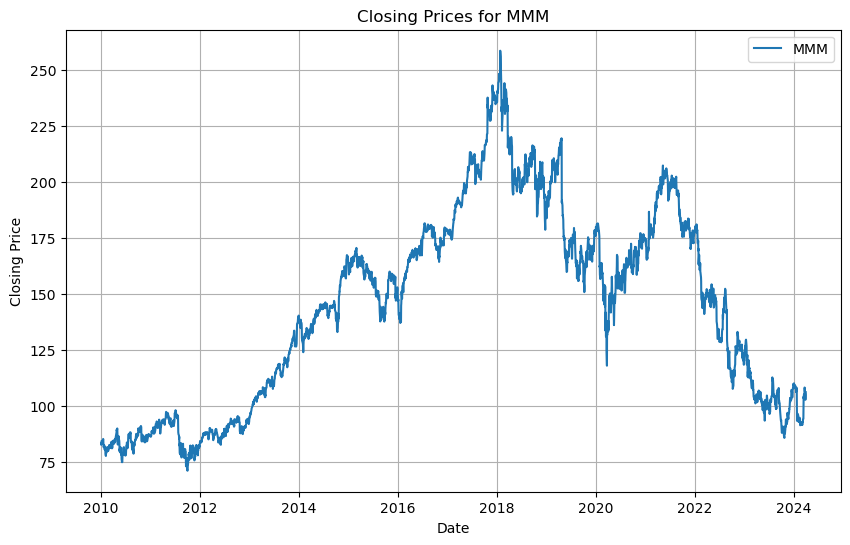

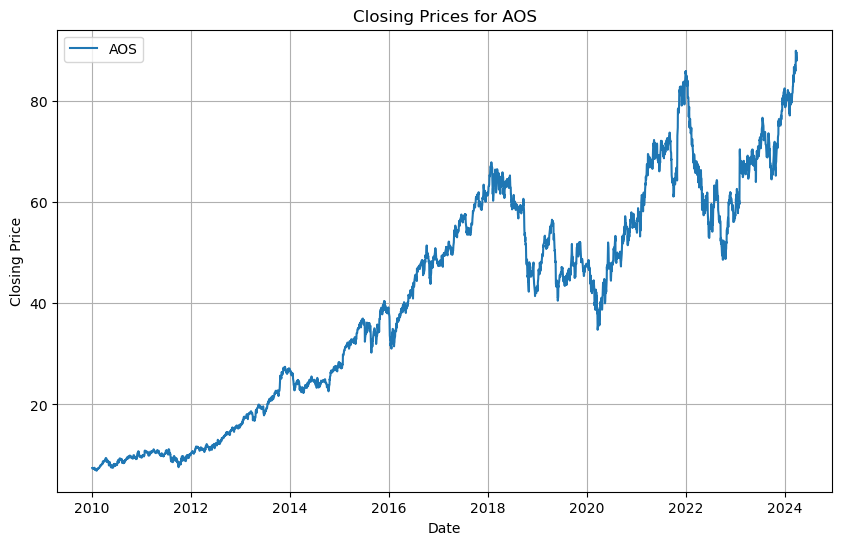

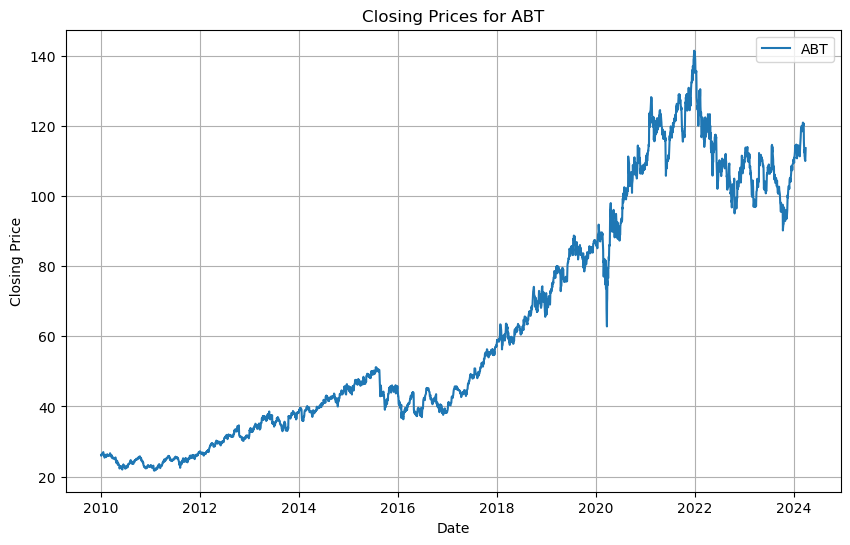

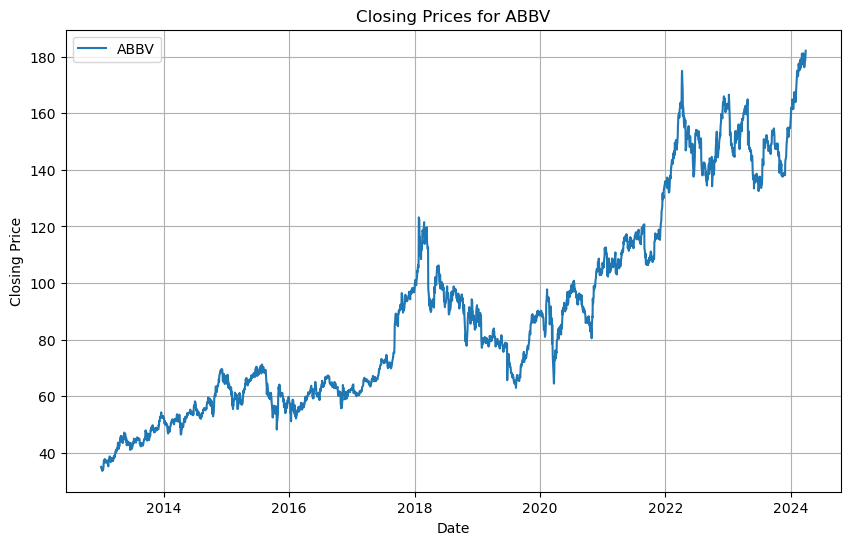

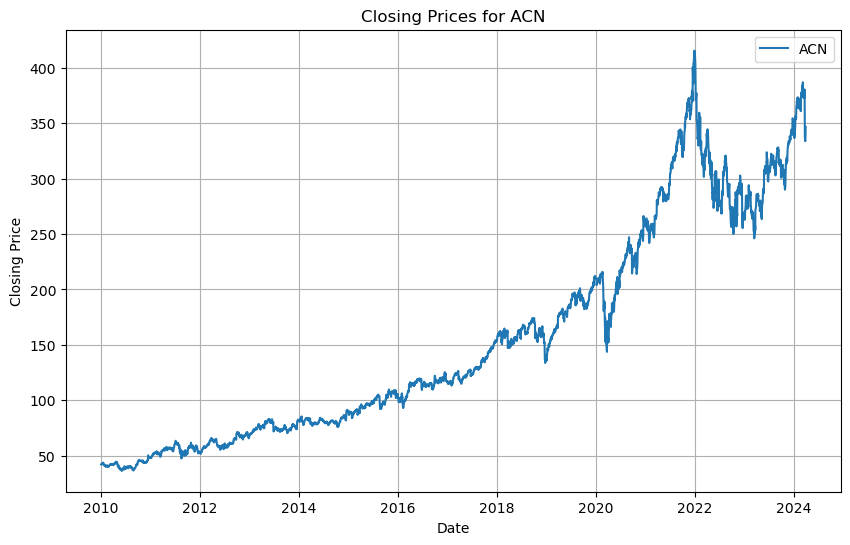

...

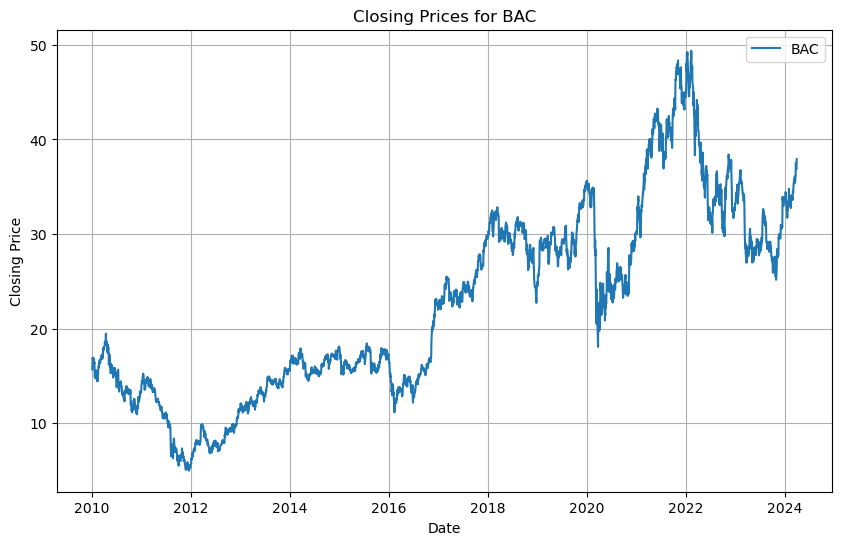

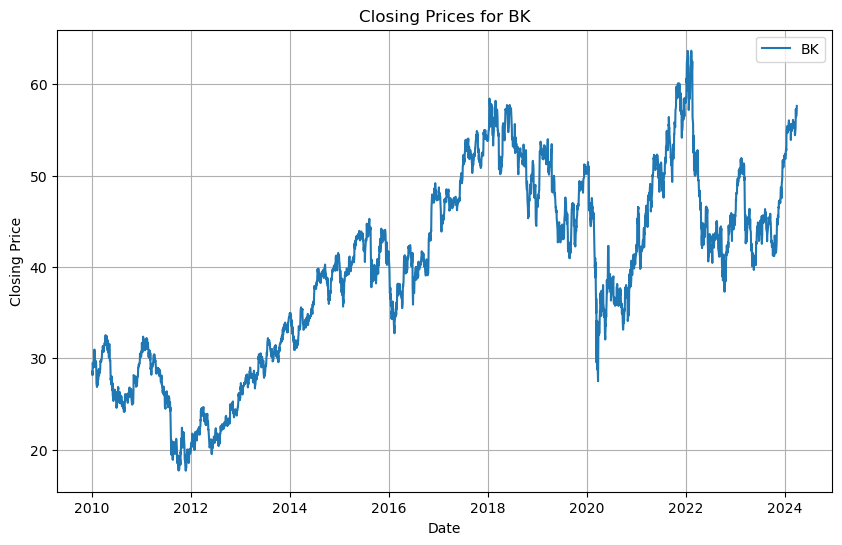

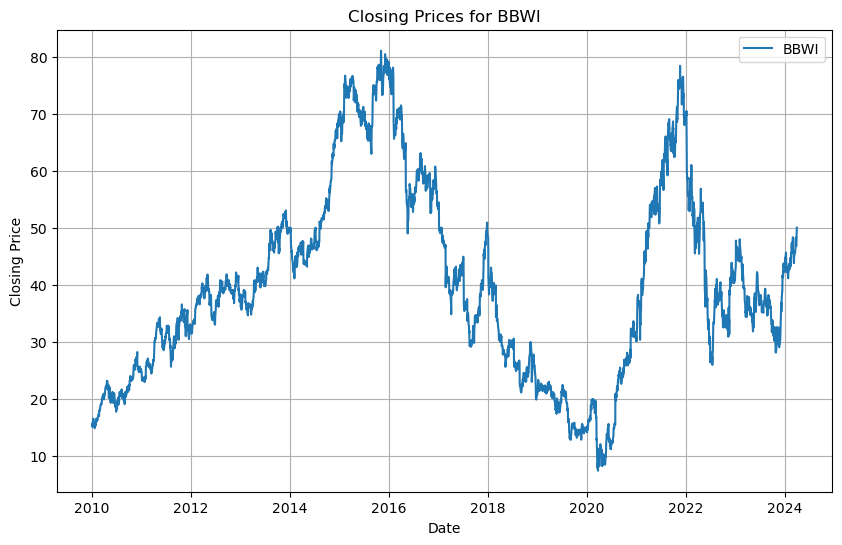

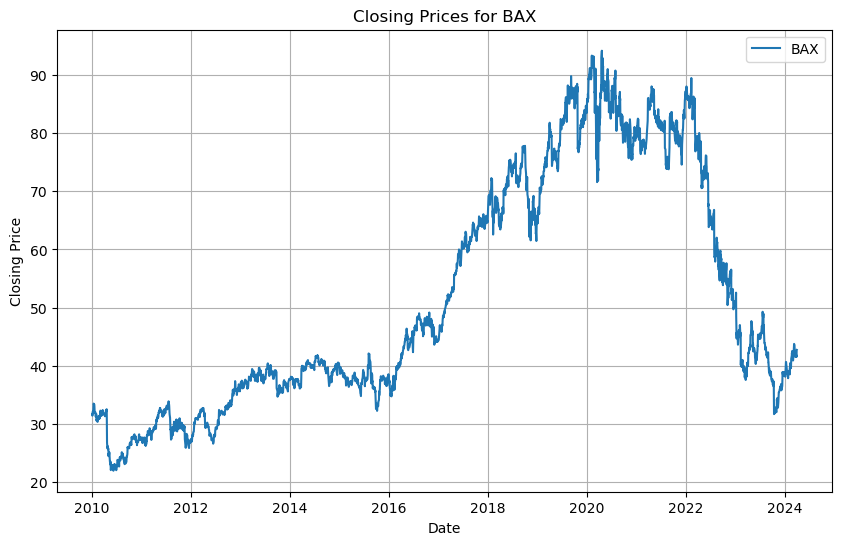

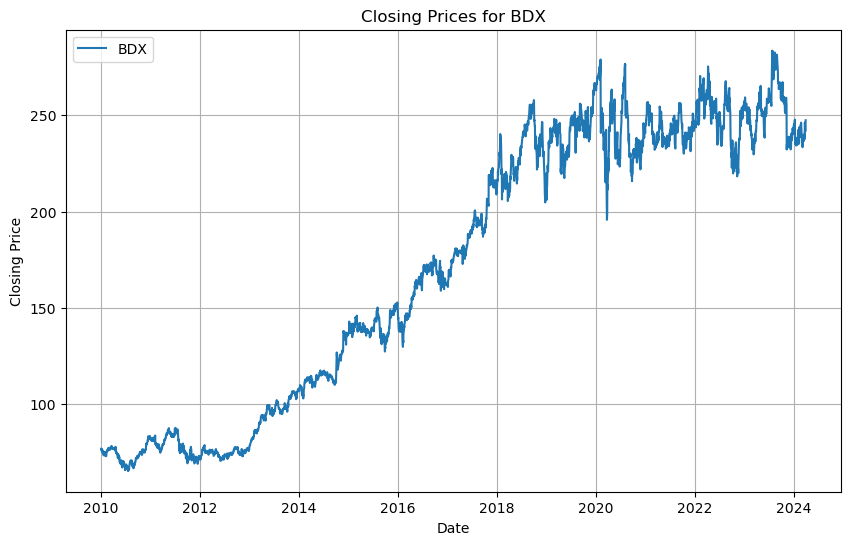

KeyError: 'BRK.B'

In [15]:
# Loop through each ticker in the S&P 500 list
for ticker in sp500_tickers:
    # closing prices for the current ticker
    closing_prices = sp500_data[ticker]['Close']
    
    # Plot the closing prices
    plt.figure(figsize=(10, 6))
    plt.plot(closing_prices, label=ticker)
    plt.title(f"Closing Prices for {ticker}")
    plt.xlabel("Date")
    plt.ylabel("Closing Price")
    plt.legend()
    plt.grid(True)
    plt.show()

To analyze some of the data we are going to apply the 100 day and 200 day moving average to each ticker

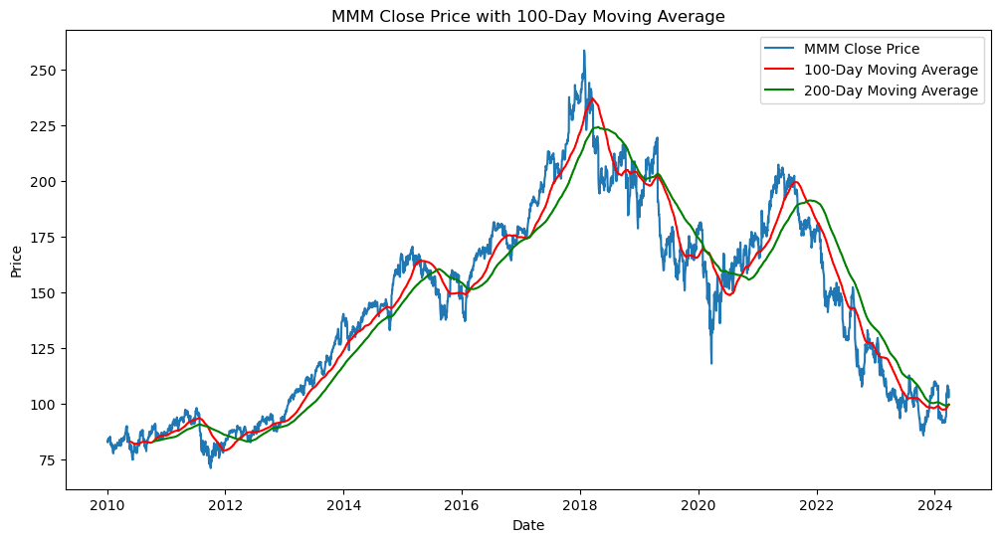

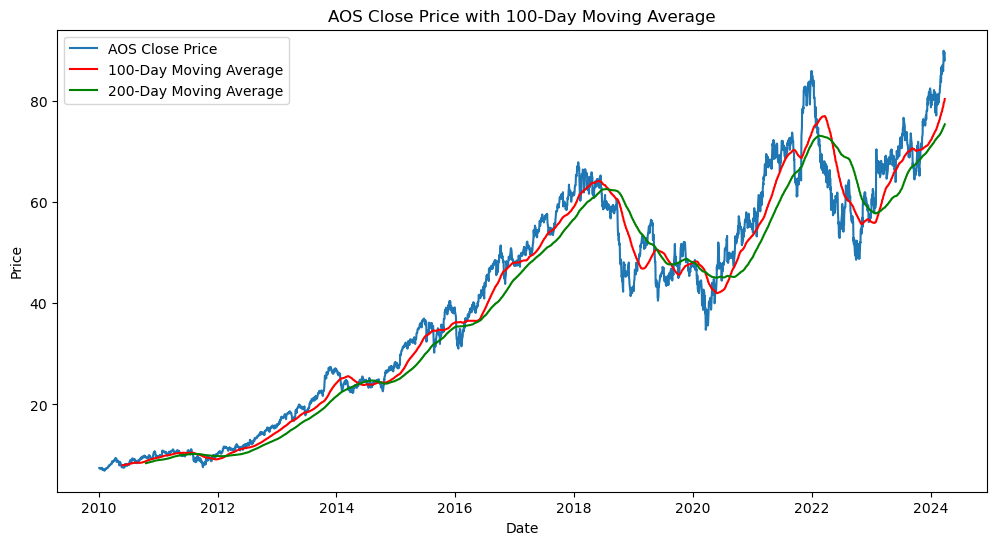

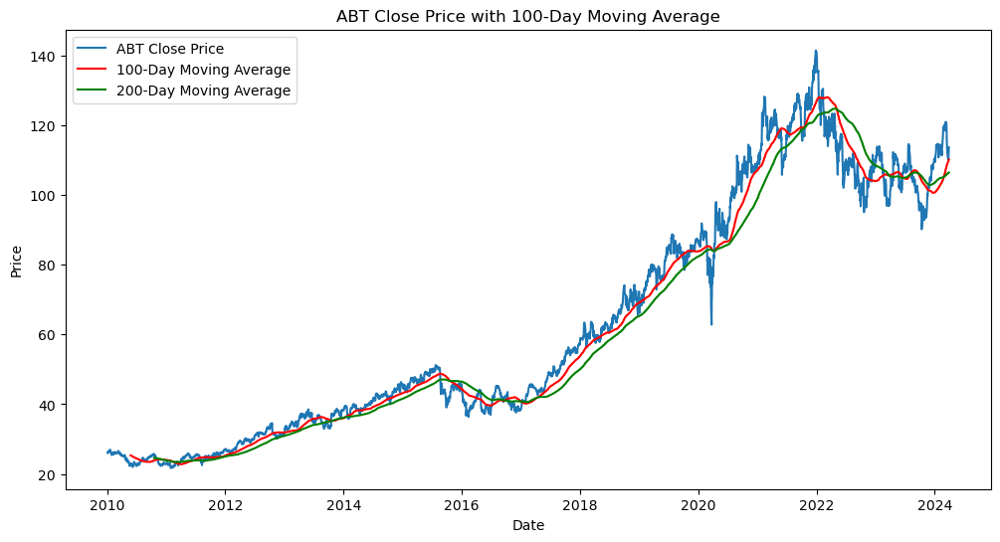

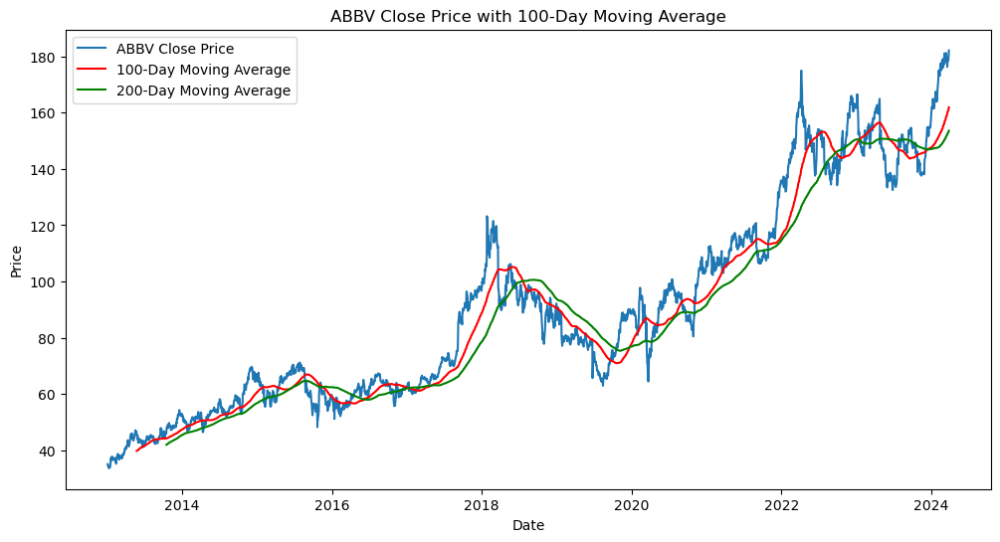

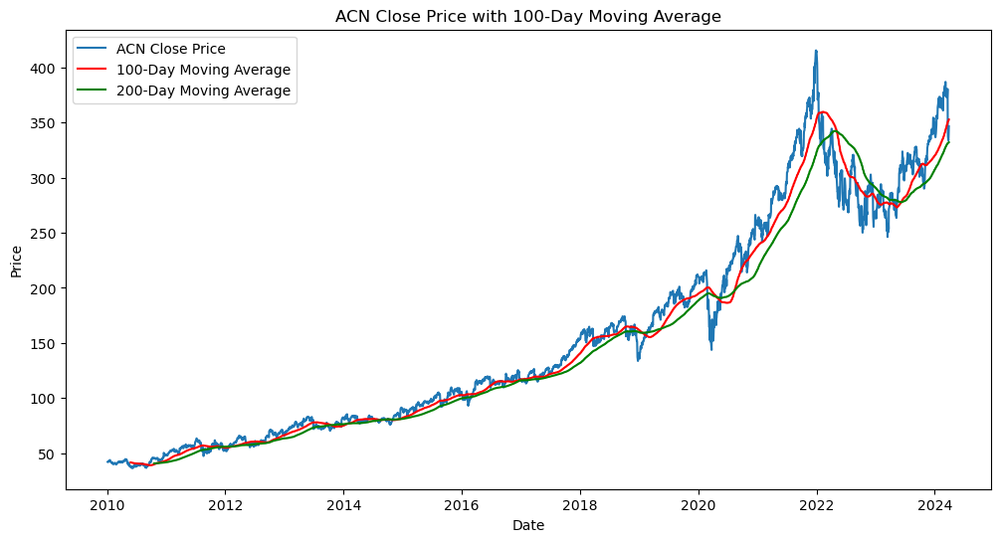

...

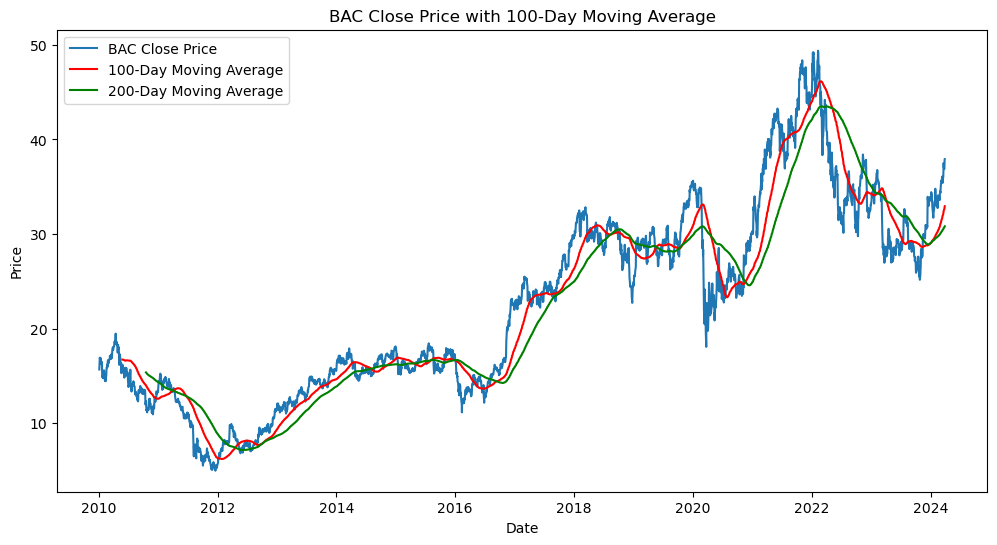

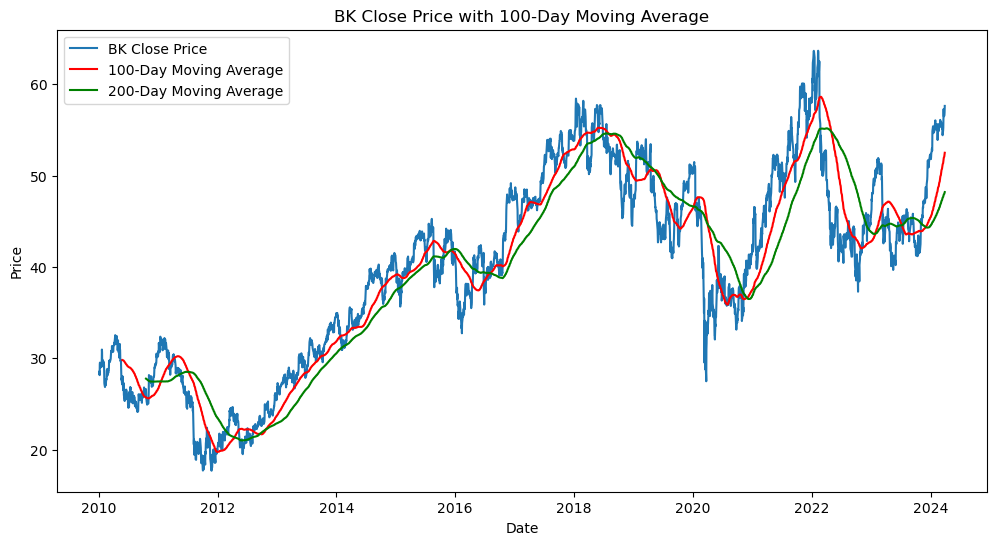

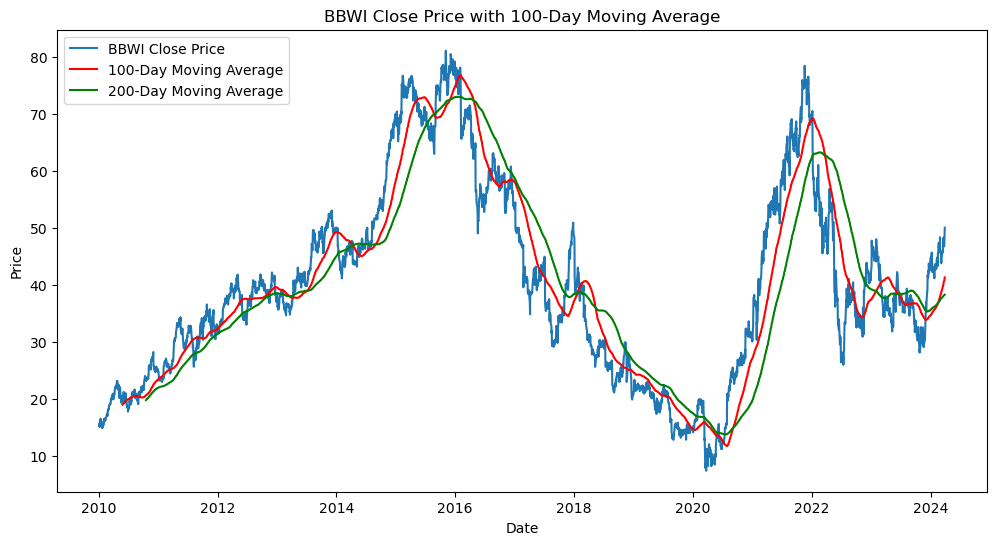

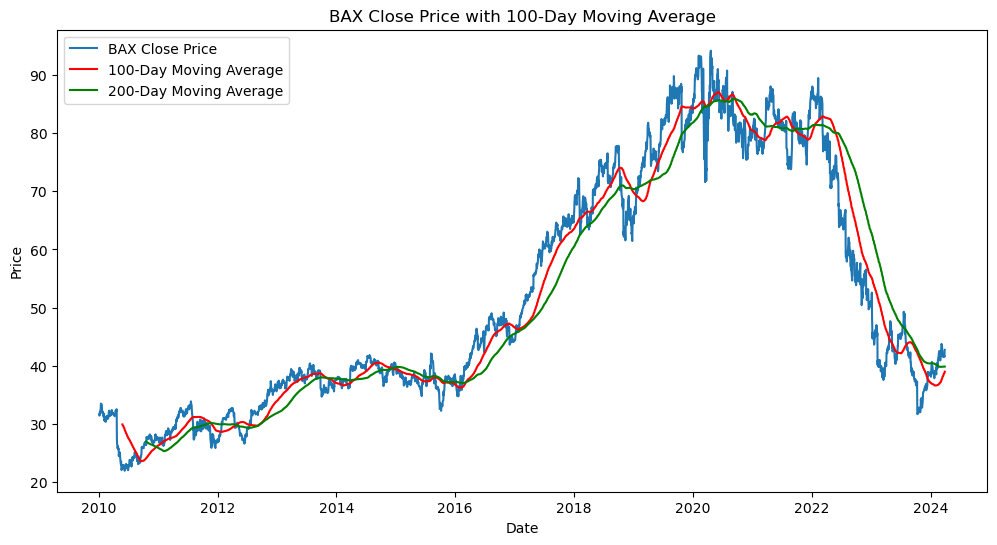

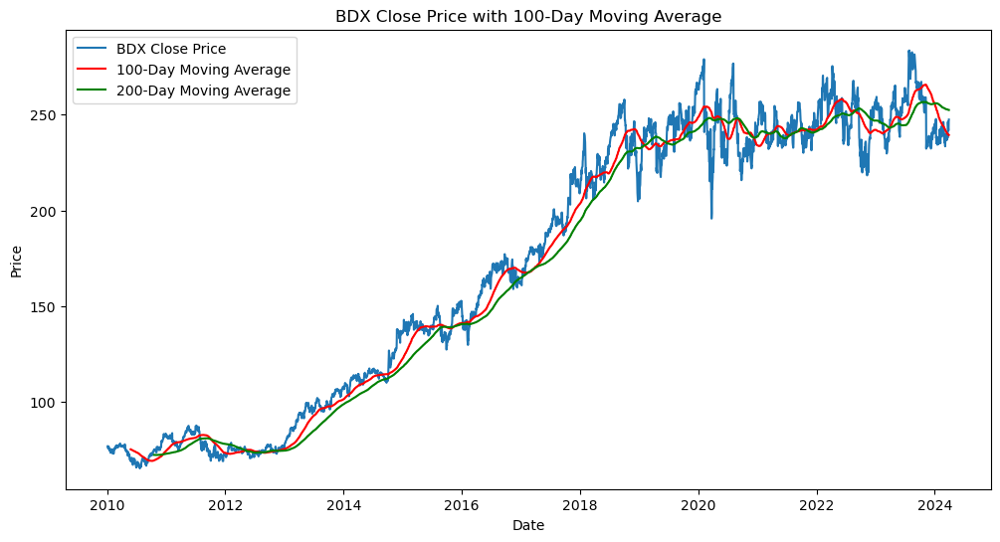

KeyError: 'BRK.B'

In [16]:
import matplotlib.pyplot as plt


for ticker in sp500_tickers:
    df = sp500_data[ticker]

    # Calculate the 100 and 200 day moving average
    ma100 = df.Close.rolling(100).mean()
    ma200 = df.Close.rolling(200).mean()
    plt.figure(figsize=(12, 6))
    plt.plot(df.Close, label=f'{ticker} Close Price')
    plt.plot(ma100, 'r', label='100-Day Moving Average')
    plt.plot(ma200, 'g', label='200-Day Moving Average')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title(f'{ticker} Close Price with 100-Day Moving Average')
    plt.legend()
    plt.show()


## Feature engineering

In [17]:
data_training = pd.DataFrame(df['Close'][0:int(len(df)*.7)])
data_testing = pd.DataFrame(df['Close'][0:int(len(df)*.7)])

### Scaling

We are going to scale the data using MinMaxScaler

The last row of the target column which should represent the stock movement that needs to be predicted is nan. We are going to remove that row from each ticker and apply the models